In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import os, sys
from PIL import Image, ImageChops
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

DIR='/content/drive/My Drive/Clipped_NDVI/'

# Loading Dataset

In [0]:
filenames = os.listdir(DIR)

In [0]:
images = [Image.open(DIR + filename) for filename in filenames]

In [0]:
(height, width) = images[0].size

In [0]:
def image2pixelarray(image):
    (width, height) = image.size
    greyscale_map = list(image.getdata())
    greyscale_map = np.array(greyscale_map)
    greyscale_map = greyscale_map.reshape((height, width))
    return greyscale_map

In [0]:
image_arrays = [image2pixelarray(im) for im in images]

## NDVI difference in range [-1, 1] ?

In [0]:
diff = (image_arrays[1] - image_arrays[0]) / (image_arrays[1] + image_arrays[0])

In [0]:
diff.min(), diff.max()

## Calculating NDVIs


In [0]:
NDVIs = [(
    (-image_arrays[i+1] + image_arrays[i]) / (image_arrays[i+1] + image_arrays[i]+0.000006)
) for i in range(0, 48, 2)]

In [0]:
NDVIs[0].min(), NDVIs[0].max()

(-0.999999958333335, 0.9999999062500088)

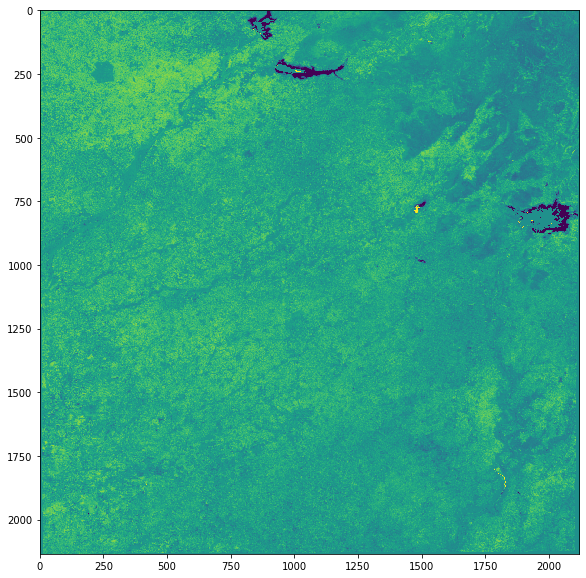

In [0]:
plt.figure(figsize=(10, 10))
plt.imshow(NDVIs[0])

In [0]:
NDVIs[0].shape

(2135, 2118)

# NDVI Images

In [0]:
def show_NDVIs(ndvis, xs=5):
    plt.figure(figsize=(xs, xs*len(ndvis)))
    for idx, img in enumerate(ndvis):
        plt.subplot(len(ndvis), 1, idx+1)
        plt.imshow(img)

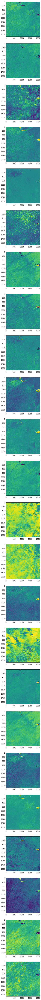

In [0]:
show_NDVIs(NDVIs, 5)

In [0]:
NDVI_17_1=NDVIs[:12]
NDVI_18_1=NDVIs[12:]

In [0]:
NDVI_17=[sum(sum(i)) for i in NDVIs[:12]]
NDVI_18=[sum(sum(i)) for i in NDVIs[12:]]

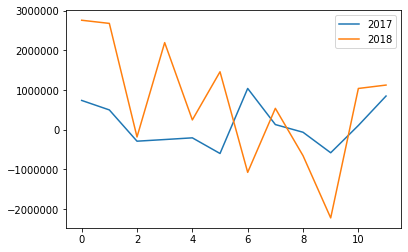

In [0]:
plt.plot(NDVI_17,label='2017')
plt.plot(NDVI_18,label='2018')
plt.legend()

## Comparing all images with respect to image of 1 month

In [0]:
def show_NDVIs_cmp(ndvis,index, xs=5):
    plt.figure(figsize=(xs, xs*len(ndvis)))
    for idx, img in enumerate(ndvis):
        plt.subplot(len(ndvis), 1, idx+1)
        plt.imshow(ndvis[index]-img,cmap='Greys')

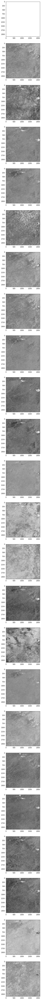

In [0]:
show_NDVIs_cmp(NDVIs,0,xs=5)

## Comparing images of two years


In [0]:
def show_NDVIs_17_18(ndvis1,ndvis2, xs=5):
    plt.figure(figsize=(2*xs, xs*len(ndvis1)))
    for idx in range(len(ndvis1)):
        plt.subplot(len(ndvis1), 2, 2*idx+1)
        plt.imshow(ndvis1[idx])
        plt.subplot(len(ndvis2),2,2*idx+2)
        plt.imshow(ndvis2[idx])

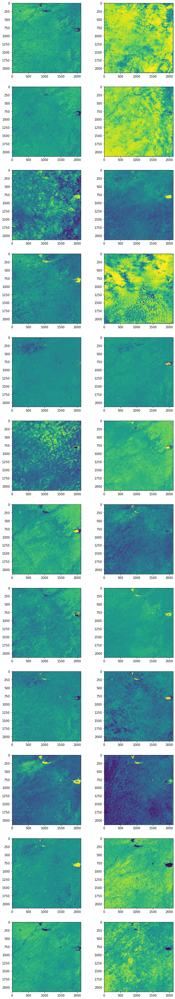

In [0]:
show_NDVIs_17_18(NDVI_17_1,NDVI_18_1)

## Comparing consecutive images

In [0]:
def show_NDVIs_cmp(ndvis,xs=5):
    plt.figure(figsize=(xs, xs*len(ndvis)))
    for idx in range(len(ndvis)-1):
      plt.subplot(len(ndvis), 1, idx+1)
      
      plt.imshow(np.ceil(ndvis[idx+1]-ndvis[idx]))

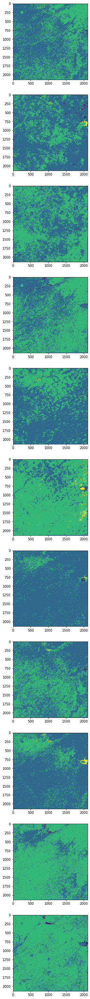

In [0]:
show_NDVIs_cmp(NDVI_17_1)

## Ploting NDVIs for single pixel

In [0]:
def pixel_value_plot(ndvis, x, y):
  values_here = [ndvis[i][x][y] for i in range(len(ndvis))]

  plt.plot(values_here)

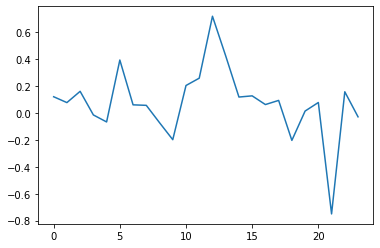

In [0]:
pixel_value_plot(NDVIs, 20, 10)

## Frequency of Pixels crossing threshold 

In [0]:
def vegetation_thres_cross_frequency(ndvis, thres=0.3):
  res = sum(
      [img > thres for img in ndvis]
  )

  plt.imshow(res, cmap="Greys")
  return res

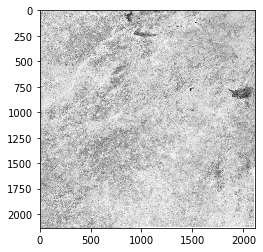

In [0]:
freqs = vegetation_thres_cross_frequency(NDVIs)

In [0]:
freqs.min(), freqs.max()

(0, 16)

In [0]:
freqs.shape

(2135, 2118)

In [0]:
coords = [(x, y) for x in range(freqs.shape[0]) for y in range(freqs.shape[1]) if freqs[x][y] > 15]

In [0]:
max_freq_coords_series = [
                          [NDVIs[idx][x][y] for idx in range(len(NDVIs))]  
                            for (x, y) in coords 
]

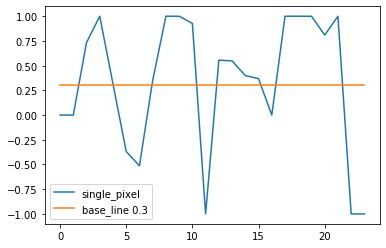

In [0]:
plt.plot(max_freq_coords_series[0],label='single_pixel')
plt.plot([0.3] * 24,label='base_line 0.3')
plt.legend()

## continuously crossed 0.3 for 3 months


In [0]:
def cont_cross_thres(thres,ndvis,month):
  cnt=0
  coords_range=[]
  for x in range(ndvis[0].shape[0]):
    for y in range(ndvis[0].shape[1]):
      tmp=0
      for j in range(len(ndvis)):
        if ndvis[j][x][y]>thres: tmp=tmp+1
        else: tmp=0
        if tmp>=month:
          cnt=cnt+1
          coords_range.append((x,y))
          break
  return coords_range

In [0]:
coords_month_2017=[cont_cross_thres(0.3,NDVIs[:12],3+i) for i in range(3)]

In [0]:
coords_month_2018=[cont_cross_thres(0.3,NDVIs[12:],3+i) for i in range(3)]

In [0]:
counts_2018 = [
               len(coords_month_2018[0]) - len(coords_month_2018[1]),
               len(coords_month_2018[1]) - len(coords_month_2018[2]),
               len(coords_month_2018[2])
]

print(counts_2018)

[38333, 62474, 5598]


In [0]:
counts_2017 = [
               len(coords_month_2017[0]) - len(coords_month_2017[1]),
               len(coords_month_2017[1]) - len(coords_month_2017[2]),
               len(coords_month_2017[2])
]

print(counts_2017)

[51987, 1087, 104]


In [0]:
crossed_counts, counts_2017, counts_2018, actual_crossed_counts

([3921813, 974873, 102932, 44478],
 [51987, 1087, 104],
 [38333, 62474, 5598],
 [2946940, 871941, 58454, 44478])

In [0]:
diff1 = list(set(coords_month[0]) - set(coords_month[1]))
diff2 = list(set(coords_month[1]) - set(coords_month[2]))
diff3 = coords_month[2]

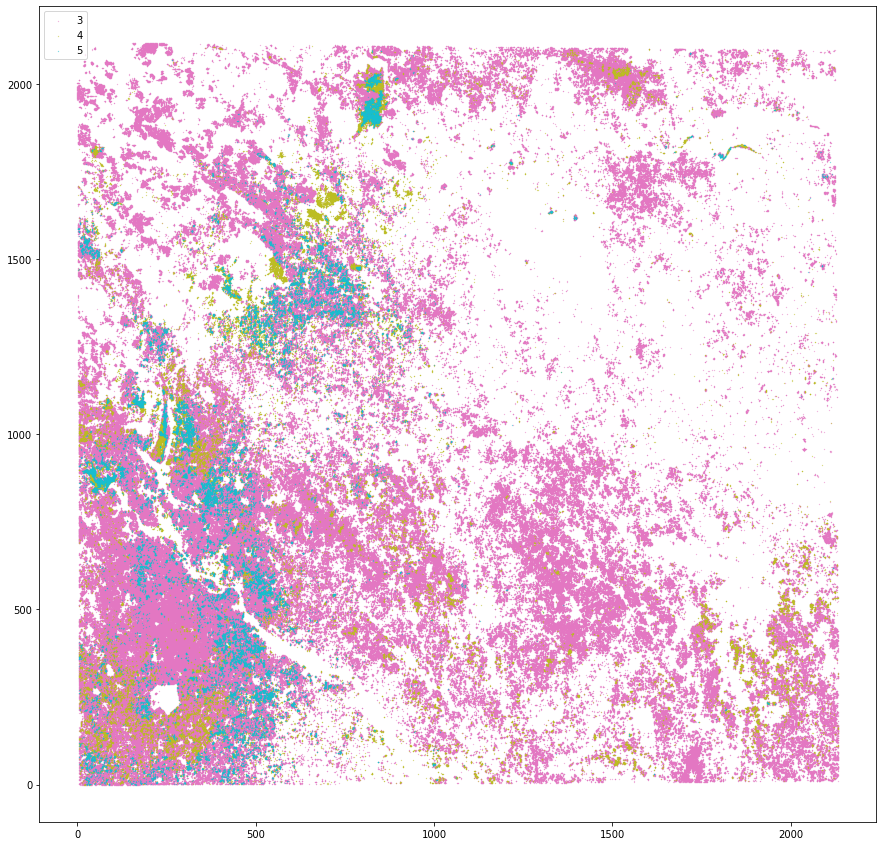

In [0]:
color=['#e377c2','#bcbd22', '#17becf']
plt.figure(figsize=(15,15))
for idx,(tmp,c) in enumerate(zip([diff1, diff2, diff3],color)):
  coords_x=[x[0] for x in tmp]
  coords_y=[x[1] for x in tmp]
  plt.scatter(coords_x,coords_y,c=c,s=0.05,label=f"{idx+3}")
plt.legend()

In [0]:
len(coords_month[0])

3921813

In [0]:
len(diff1)

871941

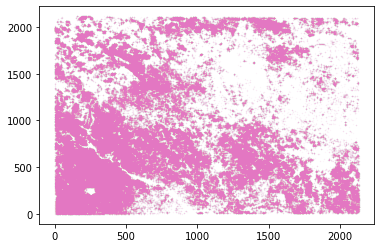

In [0]:
coords_x=[x[0] for x in diff1]
coords_y=[x[1] for x in diff1]
plt.scatter(coords_x,coords_y,c='#e377c2',s=0.0005)

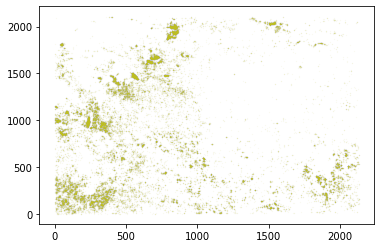

In [0]:
coords_x=[x[0] for x in diff2]
coords_y=[x[1] for x in diff2]
plt.scatter(coords_x,coords_y,c='#bcbd22',s=0.0005)

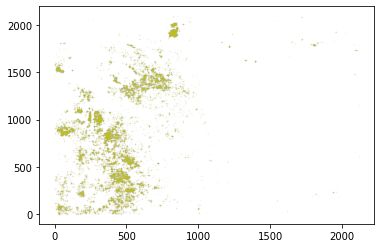

In [0]:
coords_x=[x[0] for x in diff3]
coords_y=[x[1] for x in diff3]
plt.scatter(coords_x,coords_y,c='#bcbd22',s=0.0005)

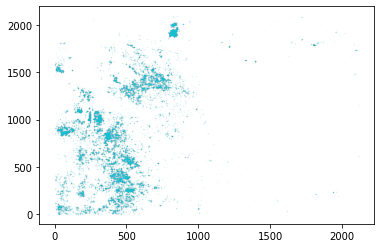

In [0]:
coords_x=[x[0] for x in coords_month[2]]
coords_y=[x[1] for x in coords_month[2]]
plt.scatter(coords_x,coords_y,c='#17becf',s=0.0005)

In [0]:
len(coords_range)

974873

In [0]:
from tqdm import tqdm_notebook

## Histogram for pixels which crossed the threshold continuously for several months

In [0]:
crossed_counts = []

for months in tqdm_notebook(range(2, 6, 1)):
  crossed_counts.append(cont_cross_thres(0.3, NDVIs, months))

print(crossed_counts)


[3921813, 974873, 102932, 44478]


## What percentage of pixels crossed the vegetation threshold continuously for X months?
(X from [3, 4, 5, 6])

In [0]:
actual_crossed_counts = [
                  crossed_counts[0]-crossed_counts[1],
                  crossed_counts[1]-crossed_counts[2],
                  crossed_counts[2]-crossed_counts[3],
                  crossed_counts[3]
]

print(actual_crossed_counts)
total_pixels = NDVIs[0].size
percentage_crossed_counts = [val * 100 / total_pixels for val in actual_crossed_counts]

print(percentage_crossed_counts)

[2946940, 871941, 58454, 44478]
[65.16996061416253, 19.282496633074814, 1.2926781263752425, 0.9836065573770492]


In [0]:
percentage_crossed_counts

[65.16996061416253, 19.282496633074814, 1.2926781263752425, 0.9836065573770492]

<BarContainer object of 3 artists>

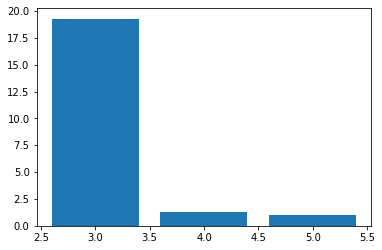

In [0]:
plt.bar([3, 4, 5], percentage_crossed_counts[1:])